In [1]:
%matplotlib inline

In [2]:
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML,Image

# Two Body Problem using Lagrange's equation

Defines a GravitationalOrbits class that is used to generate basic orbit plots from solving Lagrange's equations in cartesian coordinates

In [3]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/0/0e/Orbit5.gif')

Sample gif from wikipedia of two objects orbiting their center of mass. This gif will be able to be recreated by this notebook

In cartesian coordinates the energies of such a system under gravitational force will look like,

$\begin{align}
 T = \frac{1}{2}m_1(\dot{x_1}^2+\dot{y_1}^2)+\frac{1}{2}m_2(\dot{x_2}^2+\dot{y_2}^2)
\end{align}$

and 

$\begin{align}
  U = \frac{-Gm_1m_2}{r}
\end{align}$ with $ r = \sqrt{(x_1-x_2)^2+(y_1-y_2)^2}$

Thus the Lagrangian is 

$\begin{align}
 \mathcal{L} = \frac{1}{2}m_1(\dot{x_1}^2+\dot{y_1}^2)+\frac{1}{2}m_2(\dot{x_2}^2+\dot{y_2}^2)+\frac{Gm_1m_2}{\sqrt{(x_1-x_2)^2+(y_1-y_2)^2}}
\end{align}$


The Euler Lagrange equations are found using,

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot{q_i}} - \frac{\partial\mathcal L}{\partial{q_i}}
 = 0
  \end{align}$ for $q_i$ = $x_1$, $x_2$, $y_1$, $y_2$

Solving this gives us the equations,

$\begin{align}
 \frac{Gm_1m_2(x_1-x_2)}{R^3}+m_1\ddot{x_1}= 0
\end{align}$,

$\begin{align}
\frac{-Gm_1m_2(x_1-x_2)}{R^3}+m_2\ddot{x_2}= 0
\end{align}$,

$\begin{align}
\frac{Gm_1m_2(y_1-y_2)}{R^3}+m_1\ddot{y_1}= 0
\end{align}$, and 

$\begin{align}
\frac{-Gm_1m_2(y_1-y_2)}{R^3}+m_2\ddot{y_2}= 0
\end{align}$.

By moving the second term in each equation to the right hand side, we have the equations implemented in the class below

In [4]:
class GravitationalOrbits():
    """
     Orbits implements the parameters and Lagrange's equations for 
     a two particles orbiting under the force of gravity.
     
    Parameters
    ----------
    
    G : float
        gravitational constant
    m1 : float
        mass of first body
    m2 : float
        mass of second body
    Methods
    -------
    dz_dt(t, z)
        Returns the right side of the differential equation in vector z, 
        given time t and the corresponding value of z.
    """
    def __init__(self, m1=1.,m2=1, G=1.):
        self.G = G
        self.m1 = m1
        self.m2 = m2
    
    def dz_dt(self, t, z):
        """
        This function returns the right-hand side of the diffeq: 
        [dz/dt,d**2z/dt**2]
        
        Parameters
        ----------
        t : float
            time 
        z : float
            An 8-component vector with z(0) = x1, z(1) = x1d, 
                                       z(2) = y1, z(3) = y1d,
                                       z(4) = x2, z(5) = x2d,
                                       z(6) = y2, z(7) = x1d,
            
        Returns
        -------
        
        
        """
        R = np.sqrt( (z[0]-z[4])**2+(z[2]-z[6])**2)
        
        return [z[1],self.G*self.m2*(z[4]-z[0])/R**3,\
                z[3],self.G*self.m2*(z[6]-z[2])/R**3,\
                z[5],-self.G*self.m1*(z[4]-z[0])/R**3,\
                z[7],-self.G*self.m1*(z[6]-z[2])/R**3,]
    
        

    def solve_ode(self, t_pts, z_0, abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z_0, t_eval=t_pts, method='RK23',
                             atol=abserr, rtol=relerr)
        x1, x1d, y1, y1d, x2, x2d, y2, y2d = solution.y

        return x1, x1d, y1, y1d, x2, x2d, y2, y2d
    
    def solve_ode_lf(self, t_pts, z_0):
        """
        Solve the ODE using the leapfrog method given initial conditions
        """
        delta_t = t_pts[1]-t_pts[0]
        x1_0, x1d_0,y1_0,y1d_0,x2_0,x2d_0,y2_0,y2d_0 = z_0
        
        num_t_pts = len(t_pts)
        
        x1 = np.zeros(num_t_pts)
        x1d = np.zeros(num_t_pts)
        x1dh = np.zeros(num_t_pts)
        
        y1 = np.zeros(num_t_pts)
        y1d = np.zeros(num_t_pts)
        y1dh = np.zeros(num_t_pts)
        
        x2 = np.zeros(num_t_pts)
        x2d = np.zeros(num_t_pts)
        x2dh = np.zeros(num_t_pts)
         
        y2 = np.zeros(num_t_pts)
        y2d = np.zeros(num_t_pts)
        y2dh = np.zeros(num_t_pts)
        
        x1[0] = x1_0
        x1d[0] = x1d_0
        y1[0] = y1_0
        y1d[0] = y1d_0
        
        x2[0] = x2_0
        x2d[0] = x2d_0
        y2[0] = y2_0
        y2d[0] = y2d_0
        
        for i in np.arange(num_t_pts -1):
            t = t_pts[i]
            
            z = [x1[i],x1d[i],y1[i],y1d[i],x2[i],x2d[i],y2[i],y2d[i]]
            out = self.dz_dt(t,z)
            
            x1dh[i] = x1d[i]+out[1]*delta_t/2
            x1[i+1] = x1[i] +x1dh[i]*delta_t
            
            y1dh[i] = y1d[i]+out[3]*delta_t/2
            y1[i+1] = y1[i] +y1dh[i]*delta_t
            
            x2dh[i] = x2d[i]+out[5]*delta_t/2
            x2[i+1] = x2[i] +x2dh[i]*delta_t
            
            y2dh[i] = y2d[i]+out[7]*delta_t/2
            y2[i+1] = y2[i] +y2dh[i]*delta_t
            
            z = [x1[i+1],x1d[i],y1[i+1],y1d[i],x2[i+1],x2d[i],y2[i+1],y2d[i]]
            out = self.dz_dt(t,z)
            
            x1d[i+1] = x1dh[i]+out[1]*delta_t/2
            y1d[i+1] = y1dh[i]+out[3]*delta_t/2
            x2d[i+1] = x2dh[i]+out[5]*delta_t/2
            y2d[i+1] = y2dh[i]+out[7]*delta_t/2
        return x1, x1d, y1, y1d, x2, x2d, y2, y2d
    
    
    def E(self,t_pts,x1, x1d, y1, y1d, x2, x2d, y2, y2d):
        """
        Solve for the energy of the system
        """
        R = np.sqrt((x1-x2)**2+(y1-y2)**2)
        U = -self.G*self.m1*self.m2/R
        T = 0.5*self.m1*(x1d**2+y1d**2)+0.5*self.m2*(x2d**2+y2d**2)
        return T+U

In [5]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [6]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

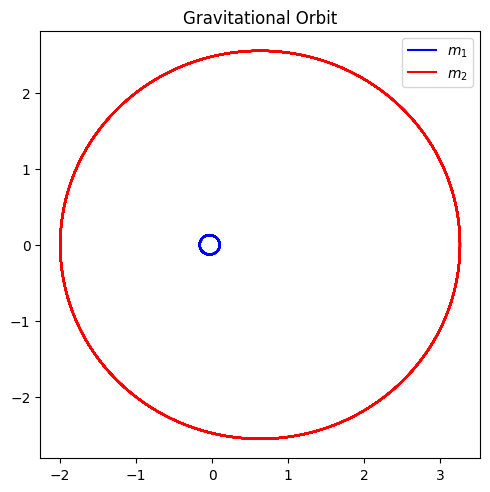

In [7]:
# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 20.
delta_t = 0.001
labels = (r'$x$', r'$y$')
t_pts = np.arange(t_start, t_end+delta_t, delta_t)  
#set parameters

G = 20.
m1 = 20.
m2 = 1.

#instantiate orbits
orb1 = GravitationalOrbits(m1,m2,G)

#initial conditions with center of mass at origin with 0 velocity 
x1_0,x1d_0 = 0.1,0
y1_0,y1d_0 = 0.,0.75
x2_0,x2d_0 = -(m1/m2)*x1_0,-(m1/m2)*x1d_0
y2_0,y2d_0 = -(m1/m2)*y1_0,-(m1/m2)*y1d_0

z_0 = [x1_0,x1d_0,y1_0,y1d_0,x2_0,x2d_0,y2_0,y2d_0]

x1, x1d, y1, y1d, x2, x2d, y2, y2d = orb1.solve_ode(t_pts,z_0)

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1)

start,stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x1,y1,color = 'blue', label=r'$m_1$')
ax.plot(x2,y2,color = 'red', label=r'$m_2$')
ax.set_title('Gravitational Orbit')
ax.legend()
ax.set_aspect(1)


fig.tight_layout()

When we plot with conditions with the center of mass at the origin and with 0 velocity, we see that the object that is much more massive does not move far from where it starts. This shows the desired effect of being in the rest frame of a object which is much more massive than the other. Since mass 1 is much greater than mass 2 the center of mass is practically where mass 1 is. This is why mass 1 barely moves and mass 2 orbits entirely around mass 1

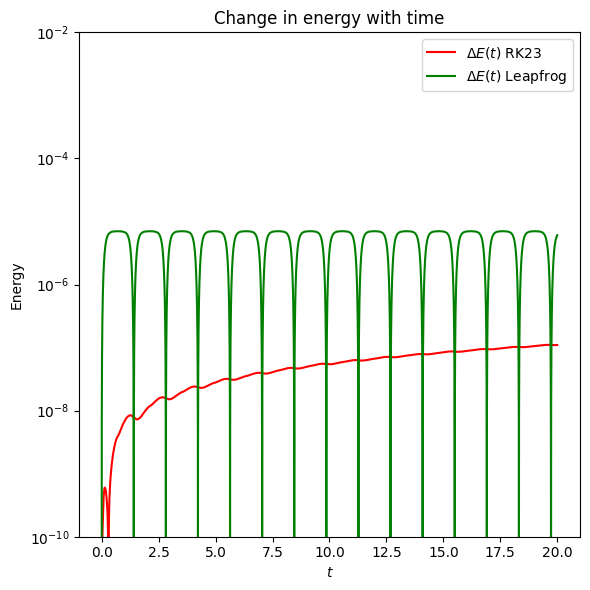

In [8]:
G = 20.
m1 = 20.
m2 = 1.

#instantiate orbits
orb1 = GravitationalOrbits(m1,m2,G)

#initial conditions with center of mass at origin with 0 velocity 
x1_0,x1d_0 = 0.1,0
y1_0,y1d_0 = 0.,0.75
x2_0,x2d_0 = -(m1/m2)*x1_0,-(m1/m2)*x1d_0
y2_0,y2d_0 = -(m1/m2)*y1_0,-(m1/m2)*y1d_0

z_0 = [x1_0,x1d_0,y1_0,y1d_0,x2_0,x2d_0,y2_0,y2d_0]

x1, x1d, y1, y1d, x2, x2d, y2, y2d = orb1.solve_ode_lf(t_pts,z_0)

#find delta_E for Leapfrog method
Energy_lf = orb1.E(t_pts,x1, x1d, y1, y1d, x2, x2d, y2, y2d)
E_tot_0_lf = Energy_lf[0]
E_tot_rel_pts_lf = np.abs((Energy_lf - E_tot_0_lf)/E_tot_0_lf)

x1, x1d, y1, y1d, x2, x2d, y2, y2d = orb1.solve_ode(t_pts,z_0)
#find delta_E for RK23 method
Energy = orb1.E(t_pts,x1, x1d, y1, y1d, x2, x2d, y2, y2d)
E_tot_0 = Energy[0]
E_tot_rel_pts = np.abs((Energy - E_tot_0)/E_tot_0)


#plot delta E
fig_5 = plt.figure(figsize=(6,6))
ax_5a = fig_5.add_subplot(1,1,1)
ax_5a.semilogy(t_pts, E_tot_rel_pts, 
               color='red', label=r'$\Delta E(t)$ RK23')
ax_5a.semilogy(t_pts, E_tot_rel_pts_lf, 
               color='green', label=r'$\Delta E(t)$ Leapfrog')

ax_5a.set_ylim(1.e-10, 1.e-2)    # (1.e-12, 5)
ax_5a.set_xlabel(r'$t$')
ax_5a.set_ylabel(r'Energy')
ax_5a.set_title('Change in energy with time')
ax_5a.legend()

fig_5.tight_layout()

The leapfrog method produces periodic results for the difference in energy. The RK23 method seems to be growing in time. This means that leapfrog is properly conserving the total energy while RK23 is not as given infinite time, leapfrog will still be periodic whereas RK23 will keep growing

In [9]:
# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 50.
delta_t = 0.01
labels = (r'$x$', r'$y$')
t_pts = np.arange(t_start, t_end+delta_t, delta_t)  
#set parameters

G = 10.
m1 = 1.
m2 = 1.

#instantiate orbits
orb1 = GravitationalOrbits(m1,m2,G)

#initial conditions with center of mass at origin with 0 velocity 
x1_0,x1d_0 = 1.,0
y1_0,y1d_0 = 0.,1
x2_0,x2d_0 = -(m1/m2)*x1_0,-(m1/m2)*x1d_0
y2_0,y2d_0 = -(m1/m2)*y1_0,-(m1/m2)*y1d_0


z_0 = [x1_0,x1d_0,y1_0,y1d_0,x2_0,x2d_0,y2_0,y2d_0]

x1, x1d, y1, y1d, x2, x2d, y2, y2d = orb1.solve_ode(t_pts,z_0)


In [10]:
%%capture
x_min = -1.2
x_max = -x_min
y_min = -1.2
y_max = -y_min

fig_anim = plt.figure(figsize=(5,5), num='Gravitational Orbits')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min,x_max)
ax_anim.set_ylim(y_min,y_max)

pt1_anim, = ax_anim.plot(x1[0],y1[0],'o', markersize=12,color='blue')
ln1_anim, = ax_anim.plot(x1,y1,color='blue',lw=3)

pt2_anim, = ax_anim.plot(x2[0],y2[0],'o', markersize=12,color='red')
ln2_anim, = ax_anim.plot(x2,y2,color='red',lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [11]:
def animatedOrbit(i):
    """
    This function creates each frame of the animation. i is used to iterate frame by frame
    """
    i_skip = 2*i
    pt1_anim.set_data(x1[i_skip],y1[i_skip])

    
    pt2_anim.set_data(x2[i_skip],y2[i_skip])
  
    
    return (pt1_anim,pt2_anim)

In [12]:
frame_interval = 20.#time between frames
frame_number =1001 #number of frames
anim = animation.FuncAnimation(fig_anim,animatedOrbit,init_func=None,frames=frame_number,interval = frame_interval,
                               blit=True,repeat=False)

In [13]:
HTML(anim.to_jshtml())#show animation

This is the same as the animation from wikipedia! (well reflected but its the same form)